In [122]:
%pylab inline

import gc
import os
import smatch
import pandas
import detect3D
import matplotlib
import matplotlib.pylab as plt

import astropy.io.fits as pyfits
import astropy.io.ascii as ascii
from astropy.table import Table,join,vstack
from configparser import ConfigParser

import maputil as mapUtil
from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTaskNew

pDict={'dempz': 'demp',\
       'dnnz': 'dnn',\
       'mizuki': 'mizuki'}

Populating the interactive namespace from numpy and matplotlib


/lustre/work/xiangchong.li/ana/lsst_stack/conda/miniconda3-py37_4.8.2/envs/lsst-scipipe-cb4e2dc/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['vstack', 'plt']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [3]:
key='dempz'
colname=pDict[key]
glab='test'
fieldname='XMM'
pzDir=os.path.join('datDir/catalog_tracts/','%s_tracts/' %fieldname)
assert os.path.isdir(pzDir)

baseDir=  'wrkDir/test4/'
assert os.path.isdir(baseDir)
catDir=   baseDir
outDir=   os.path.join(baseDir,'out')
if not os.path.isdir(outDir):
    print('making outDir')
    os.mkdir(outDir)
mockOutDir=   os.path.join(baseDir,'out-mock')
if not os.path.isdir(mockOutDir):
    print('making mockOutDir')
    os.mkdir(mockOutDir)
    
    
fnameT=os.path.join('wrkDir/reGaus_catalog/','%s.fits' %fieldname)
assert os.path.isfile(fnameT)

# prepare Catalog
## main catalog

In [10]:
fname=os.path.join(catDir,'src.fits')
pzfname=os.path.join(catDir,'poz-%s.fits' %(key))
if not os.path.isfile(fname):
    data=pyfits.getdata(fnameT)
    raMin=31;raMax=35.
    decMin=-6;decMax=-2.
    mask=(data['ra']>raMin)&(data['ra']<raMax)
    mask&=(data['dec']>decMin)&(data['dec']<decMax)
    data=data[mask]
    pyfits.writeto(fname,data,overwrite=True)
    
if not os.path.isfile(pzfname):
    data=Table.read(fname)
    ids=data['Id',]
    ids.rename_column('Id','ID')
    tracts=list(set(data['tract']))
    print(tracts)
    pzAll=[]
    for tract in tracts:
        pfname=os.path.join(pzDir,'%s_pz_pdf_%s.fits' %(tract,key))
        pzs=Table.read(pfname)
        pzAll.append(join(left=ids,right=pzs,keys='ID',join_type='inner'))
        del pzs,pfname
        gc.collect()
    pzAll=vstack(pzAll)
    pzAll.sort('ID')
    assert np.all(data['Id']==pzAll['ID'])
    del ids,tracts,data
    gn=fname.split('-')[-1].split('.')[0]
    pzAll.write(pzfname,overwrite=True)
    del pzAll
    gc.collect()

[8521, 8522, 8523, 8524, 9005, 9006, 9007, 9008, 8280, 8281, 8282, 8763, 8764, 8765, 8766]


## mock catalogs

In [11]:
nsim=200
mockDir=   os.path.join(baseDir,'mock')
if not os.path.isdir(mockDir):
    print('making mockDir')
    os.mkdir(mockDir)
    print('making mock catalog')
    data=pyfits.getdata(fname)
    nobj=len(data)
    for i in range(nsim):
        catMock   =  data.copy()
        np.random.seed(i)
        phi = 2.0 * np.pi * np.random.rand(nobj)
        g1n,g2n   =   mapUtil.rotCatalog(data['g1'],data['g2'],phi)
        catMock['g1']=g1n
        catMock['g2']=g2n
        pyfits.writeto(os.path.join(mockDir,'src-%d.fits' %i),catMock,overwrite=True)
        del catMock
        gc.collect()

making mockDir
making mock catalog


# pozAve and lensing kernel

In [12]:
nz=10
outname1=os.path.join(catDir,'pozave-%s-%dbins.fits' %(key,nz))
outname2=os.path.join(catDir,'pozave-%s-%dbins.png' %(key,nz))

if not os.path.isfile(outname1):
    print('Measuring the poz average')
    pzDir=os.path.join('datDir/catalog_tracts/','XMM_tracts/')
    pbins= pyfits.getdata(os.path.join(pzDir,'8522_pz_pdf_%s.fits' %key),ext=2)['BINS']
    nbin=len(pbins)

    data=pyfits.getdata(fname)
    # poz average
    mask=(~np.isnan(data['%s_zbest' %colname]))\
        &(data['%s_zbest_std'%colname]<1.0)\
        &(data['%s_zbest'%colname]<3.0)\
        &(data['%s_zbest'%colname]>0.05)
    poz_best=data['%s_zbest'%colname]
    poz_best=poz_best[mask]
    zbounds=np.percentile(poz_best,np.linspace(0,100,nz+1))

    pfname=os.path.join(catDir,'poz-%s.fits' %key)
    pata=pyfits.getdata(pfname)
    pata=pata[mask]
    poz_ave=np.zeros((nz,nbin))
    for iz in range(nz):
        tmp_msk=(poz_best>=zbounds[iz])&(poz_best<zbounds[iz+1])
        poz_ave[iz]=np.average(pata['PDF'][tmp_msk],axis=0)
    out=pyfits.HDUList([pyfits.PrimaryHDU(poz_ave),\
        pyfits.BinTableHDU.from_columns(
            [pyfits.Column(name='zbounds',array=zbounds,format='D')]
            )
       ])
    out.writeto(outname1,overwrite=True)
    del data,pata,out,nbin
    gc.collect()
    mapUtil.plotPozAve(glab,pbins,poz_ave,outname2)
else:
    poz_ave=pyfits.getdata(outname1,ext=0)
    zbounds=pyfits.getdata(outname1,ext=1)['zbounds']
    pbins= pyfits.getdata(os.path.join(pzDir,'8522_pz_pdf_%s.fits' %key),ext=2)['BINS']
print('zbounds:', zbounds)

Measuring the poz average
zbounds: [0.06       0.36000001 0.47999999 0.62       0.73000002 0.85000002
 0.97000003 1.13       1.26999998 1.54999995 2.99000001]


In [13]:
# configuration
configName  =   'wrkDir/sim/config-obs-nl12-pc.ini'
assert os.path.isfile(configName)
parser      =   ConfigParser()
parser.read(configName)
parser.set('sourceZ','zbound','[%s]' %(','.join([str(bb) for bb in zbounds])))
gridInfo    =   cartesianGrid3D(parser)

In [14]:
lenskerfname=os.path.join(outDir,'lensker-%s-10bins.fits' %key)
# lensing kernel
lensKer1= gridInfo.lensing_kernel()
lensKer2= gridInfo.lensing_kernel(poz_grids=pbins,poz_ave=poz_ave,deltaIn=False)
#lensKer2= gridInfo.lensing_kernel(poz_grids=pbins,poz_ave=poz_ave)
out=pyfits.HDUList([pyfits.PrimaryHDU(lensKer2),pyfits.ImageHDU(lensKer1)])
out.writeto(lenskerfname,overwrite=True)
pltname=os.path.join(outDir,'lensker-%s-10bins.png' %key)
mapUtil.plotLensKernel(glab,gridInfo.zcgrid,lensKer1,lensKer2,pltname)

# Pixelization
## main catalog

In [15]:
g1fname=os.path.join(outDir,'g1Map-%s.fits' %(key))
g2fname=os.path.join(outDir,'g2Map-%s.fits' %(key))
nfname=os.path.join(outDir,'nMap-%s.fits' %(key))
nwfname=os.path.join(outDir,'nwMap-%s.fits' %(key))
stdfname=os.path.join(outDir,'stdMap-%s.fits' %(key))

# poz selection
data=pyfits.getdata(fname)
mask=(~np.isnan(data['%s_zbest' %colname]))\
    &(data['%s_zbest_std'%colname]<1.0)\
    &(data['%s_zbest'%colname]<3.0)\
    &(data['%s_zbest'%colname]>0.05)

data=data[mask]
wsAve=np.average(data['weight'])
ws=data['weight']/wsAve
ws0=data['weight']
#ws=np.ones(len(data))

# pixelization
z=data['%s_zbest'%colname]
x,y=gridInfo.setupTanPlane(data['ra'],data['dec'],pad=0.5)
out0=gridInfo.pixelize_data(x,y,z)
out0w=gridInfo.pixelize_data(x,y,z,ws=ws)
overStd2=gridInfo.pixelize_data(x,y,z,ws=ws0)
outStd=np.sqrt(1./(overStd2+1e-5))

plt.close()
plt.hist(np.ravel(out0),bins=np.arange(-0.5,20,1))

out1=gridInfo.pixelize_data(x,y,z,data['g1'],ws=ws)
out2=gridInfo.pixelize_data(x,y,z,data['g2'],ws=ws)
mask=(out0>2.).astype(int)
out1=out1*mask
out2=out2*mask
outStd=outStd*mask

pyfits.writeto(g1fname,out1,overwrite=True)
pyfits.writeto(g2fname,out2,overwrite=True)
pyfits.writeto(nfname,out0,overwrite=True)
pyfits.writeto(nwfname,out0w,overwrite=True)
pyfits.writeto(stdfname,outStd,overwrite=True)
outname3=os.path.join(outDir,'g1Hist-%s.png' %(key))
mapUtil.plotHist(glab,data['g1'],out1[out1!=0],outname3)
del out1,out2,data,x,y,z,ws
gc.collect()

14964

## mock catalogs

In [16]:
pixmockDir=   os.path.join(baseDir,'pixes-mock')
if False:
    stdfnameRot=os.path.join(outDir,'stdMapRot-%s.fits' %(key))
    data=pyfits.getdata(fname)
    mask=(~np.isnan(data['%s_zbest' %colname]))\
        &(data['%s_zbest_std'%colname]<1.0)\
        &(data['%s_zbest'%colname]<3.0)\
        &(data['%s_zbest'%colname]>0.05)
    data=data[mask]
    wsAve=np.average(data['weight'])
    ws=data['weight']/wsAve
    z=data['%s_zbest'%colname]
    x,y=gridInfo.setupTanPlane(data['ra'],data['dec'],pad=0.5)
    out0=gridInfo.pixelize_data(x,y,z)
    mapmask=(out0>2.).astype(int)
    del data
    gc.collect()
    gStd=np.zeros(gridInfo.shape)
    for i in range(nsim):
        fname2=os.path.join(pixmockDir,'src-%s.fits' %i)
        data=pyfits.getdata(fname2)[mask]
        out1=gridInfo.pixelize_data(x,y,z,data['g1'],ws=ws)
        out2=gridInfo.pixelize_data(x,y,z,data['g2'],ws=ws)
        out1=out1*mapmask
        out2=out2*mapmask
        outname1=os.path.join(pixmockDir,'g1Map-%s-%s.fits' %(key,i))
        outname2=os.path.join(pixmockDir,'g2Map-%s-%s.fits' %(key,i))
        pyfits.writeto(outname1,out1,overwrite=True)
        pyfits.writeto(outname2,out2,overwrite=True)
        gStd+=(out1)**2.
        gStd+=(out2)**2.
        del out1,out2,data,fname2
        gc.collect() 
    gStd/=nsim
    gStd=np.sqrt(gStd)
    pyfits.writeto(stdfnameRot,gStd,overwrite=True)

# reconstruction
## prepare

In [94]:
assert os.path.isfile(g1fname)
assert os.path.isfile(g2fname)
assert os.path.isfile(stdfname)
assert os.path.isfile(lenskerfname)

# configuration
parser.set('prepare','g1fname',g1fname)
parser.set('prepare','g2fname',g2fname)
parser.set('prepare','sigmafname',stdfname)
parser.set('prepare','lkfname',lenskerfname)

if False:
    parser.set('lensZ','resolve_lim','.5')
    parser.set('lensZ','rs_base','.12')
    #parser.set('lensZ','rs_base','0.')    #Mpc/h
else:
    parser.set('lensZ','atomFname','wrkDir/sim/prior/haloBasis-obs-nl12-m146_152.fits')

# Reconstruction Init
lbd=2.
parser.set('sparse','lbd','%s' %lbd )
parser.set('sparse','lcd','0')

parser.set('sparse','nframe','1' )
parser.set('sparse','mu','4e-4')

a=pyfits.getdata(stdfname)
nz,ny,nx=a.shape
parser.set('transPlane','ny','%d' %ny)
parser.set('transPlane','nx','%d' %nx)
sparse3D    =   massmapSparsityTaskNew(parser)

In [95]:
stdAfname=os.path.join(outDir,'stdA-ridge.fits')
if not os.path.isfile(stdAfname):
    nsim=200
    tFname='wrkDir/test4/out-mock/alphaRW-enet-%d.fits'
    a2Sum=np.zeros(sparse3D.shapeA)
    for i in range(nsim):
        a=pyfits.getdata(tFname %(i))
        a2Sum+=a**2.
        del a
        gc.collect()
    stdA=np.sqrt(a2Sum/nsim)
    stdA=stdA+1e-5
    pyfits.writeto(stdAfname,stdA,overwrite=True)
    plt.close()
    plt.imshow(stdA[0,0])
else:
    stdA=pyfits.getdata(stdAfname)
for i in range(12):
    print(i+1,np.average(stdA[i,0,10:-10,10:-10]))

1 0.14825087864458952
2 0.15881358119421474
3 0.1604241470607073
4 0.15461614388038528
5 0.1466419137944174
6 0.1394734627432872
7 0.1322770590962414
8 0.13031700255389042
9 0.1371290549196162
10 0.1579202853029405
11 0.19004466220168859
12 0.23247846844976308


CPU times: user 59.6 s, sys: 32.3 s, total: 1min 31s
Wall time: 1min 31s


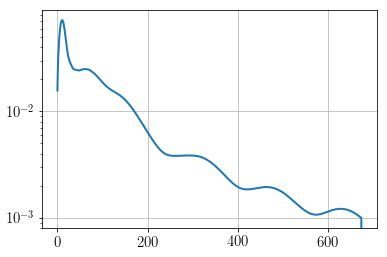

In [96]:
%%time
sparse3D.lbd=0.
sparse3D.lcd=1.
sparse3D.nonNeg=False
sparse3D.clean_outcome()
sparse3D.optimized_gradient_descent(3000)
outfname1=os.path.join(outDir,'alphaRW-lasso-lbd%02d-lcd%02d.fits' %(sparse3D.lbd*10,sparse3D.lcd*10))
outfname2=os.path.join(outDir,'deltaR-lasso-lbd%02d-lcd%02d.fits' %(sparse3D.lbd*10,sparse3D.lcd*10))
pyfits.writeto(outfname1,sparse3D.alphaR,overwrite=True)
sparse3D.reconstruct()
pyfits.writeto(outfname2,sparse3D.deltaR,overwrite=True)
#plot
plt.plot(sparse3D.diff)
plt.yscale('log')
plt.grid()

CPU times: user 40.6 s, sys: 22.4 s, total: 1min 2s
Wall time: 1min 2s


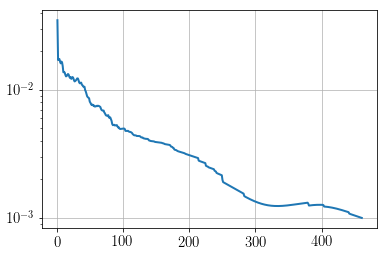

In [98]:
%%time
sparse3D.lbd=10.
sparse3D.lcd=1.
sparse3D.nonNeg=True
w   =   sparse3D.adaptive_lasso_weight(gamma=2.)
sparse3D.fista_gradient_descent(800,w=w*stdA**2.)
outfname1=os.path.join(outDir,'alphaRW-alasso-lbd%02d.fits' %(sparse3D.lbd*10))
pyfits.writeto(outfname1,sparse3D.alphaR,overwrite=True)
sparse3D.reconstruct()
outfname2=os.path.join(outDir,'deltaR-alasso-lbd%02d.fits' %(sparse3D.lbd*10))
pyfits.writeto(outfname2,sparse3D.deltaR,overwrite=True)

#plot
plt.plot(sparse3D.diff)
plt.yscale('log')
plt.grid()

CPU times: user 18.6 s, sys: 9.77 s, total: 28.4 s
Wall time: 28.4 s


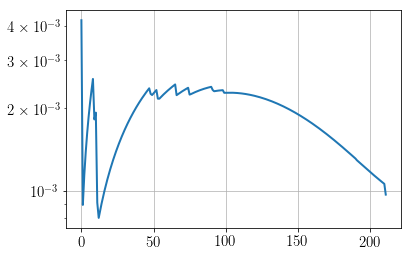

In [99]:
%%time
sparse3D.lbd=10.
sparse3D.lcd=0.
sparse3D.nonNeg=True
w   =   sparse3D.adaptive_lasso_weight(gamma=2.)
sparse3D.fista_gradient_descent(800,w=w*stdA**2.)
outfname1=os.path.join(outDir,'alphaRW-alasso-lbd%02d.fits' %(sparse3D.lbd*10))
pyfits.writeto(outfname1,sparse3D.alphaR,overwrite=True)
sparse3D.reconstruct()
outfname2=os.path.join(outDir,'deltaR-alasso-lbd%02d.fits' %(sparse3D.lbd*10))
pyfits.writeto(outfname2,sparse3D.deltaR,overwrite=True)

#plot
plt.plot(sparse3D.diff)
plt.yscale('log')
plt.grid()

CPU times: user 17.3 s, sys: 31.5 s, total: 48.8 s
Wall time: 1min


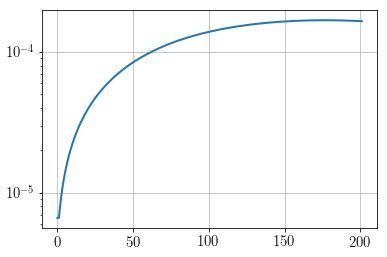

In [116]:
%%time
sparse3D.lbd=0.1
sparse3D.lcd=0.
sparse3D.nonNeg=True
w   =   sparse3D.adaptive_lasso_weight(gamma=2.)
sparse3D.fista_gradient_descent(800,w=w*stdA**2.)
outfname1=os.path.join(outDir,'alphaR-nng-alasso-lbd%02d.fits' %(sparse3D.lbd*10))
pyfits.writeto(outfname1,sparse3D.alphaR*sparse3D._w,overwrite=True)
sparse3D.reconstruct()
outfname2=os.path.join(outDir,'deltaR-nng-alasso-lbd%02d.fits' %(sparse3D.lbd*10))
pyfits.writeto(outfname2,sparse3D.deltaR,overwrite=True)

#plot
plt.plot(sparse3D.diff)
plt.yscale('log')
plt.grid()

In [283]:
delta   =   pyfits.getdata(outfname1)
names   =   ('iz','iy','ix','value')
c1,v1   =   detect3D.local_maxima_3D(delta[:,0,:,:])
data1   =   np.hstack([c1,v1[:,None]])
src     =   Table(data=data1,names=names)

src['ra']=np.zeros(len(src))
src['dec']=np.zeros(len(src))
src['z']=np.zeros(len(src))
for ss in src:
    ss['ra']=gridInfo.xcgrid[int(ss['ix'])]
    ss['dec']=gridInfo.ycgrid[int(ss['iy'])]
    ss['z']=gridInfo.zlcgrid[int(ss['iz'])]
src['matched']=np.zeros(len(src)).astype(bool)

## Other observation

In [125]:
# weak lensing cluster
clusters=pandas.read_csv('wrkDir/Miyazaki_wlClusters.csv',comment='#').to_records()
mask=(clusters['zcl']>0.)
clusters=clusters[mask]
zcl=clusters['zcl']
ycl=clusters['DEC2000']
xcl=clusters['RA2000']
outfname=os.path.join(outDir,'clsmap.fits')
if not os.path.isfile(outfname):
    #clsMap=numpy.histogramdd((zcl,ycl,xcl),bins=(gridInfo.zlbound,gridInfo.ybound,gridInfo.xbound))[0]
    clsMap=numpy.histogramdd((ycl,xcl),bins=(gridInfo.ybound,gridInfo.xbound))[0]
    pyfits.writeto(outfname,clsMap,overwrite=True)

In [126]:
lensDir=os.path.join(os.environ['homeWrk'],'lensCatalog/')
# CAMIRA
cclusters=pandas.read_csv(os.path.join(lensDir,'CAMIRA/CAMIRA_S16A.csv')).to_records()
mask=(cclusters['z_cl']>0.)
cclusters=cclusters[mask]
czcl=cclusters['z_cl']
cycl=cclusters['coord_dec']
cxcl=cclusters['coord_ra']
outfname='camira_clsmap.fits'
outfname=os.path.join(outDir,outfname)
if not os.path.isfile(outfname):
    #clsMap=numpy.histogramdd((czcl,cycl,cxcl),bins=(gridInfo.zlbound,gridInfo.ybound,gridInfo.xbound))[0]
    clsMap=numpy.histogramdd((cycl,cxcl),bins=(gridInfo.ybound,gridInfo.xbound))[0]
    pyfits.writeto(outfname,clsMap,overwrite=True)

In [127]:
# WHL
whlclusters=ascii.read(os.path.join(lensDir,'WHL15/table3.dat'))
mask=(whlclusters['col5']>0.)
whlclusters=whlclusters[mask]
wzcl=whlclusters['col5']
wycl=whlclusters['col4']
wxcl=whlclusters['col3']
outfname=os.path.join(outDir,'WHL_clsmap.fits')
if not os.path.isfile(outfname):
    clsMap=numpy.histogramdd((wycl,wxcl),bins=(gridInfo.ybound,gridInfo.xbound))[0]
    pyfits.writeto(outfname,clsMap,overwrite=True)

In [128]:
# MCXC catalog
clusters=ascii.read(os.path.join(lensDir,'MCXC/mcxc_109_204.dat'))
mask=(clusters['col5']>0.)
clusters=clusters[mask]
mzcl=clusters['col5']
mycl=clusters['col2']
mxcl=clusters['col1']
outfname=os.path.join(outDir,'mcxc_clsmap.fits')
if not os.path.isfile(outfname):
    clsMap=numpy.histogramdd((mzcl,mycl,mxcl),bins=(gridInfo.zlbound,gridInfo.ybound,gridInfo.xbound))[0]
    pyfits.writeto(outfname,clsMap,overwrite=True)

69
37
45
[0. 1. 0. 0. 1. 0. 1. 1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 1. 1.
 0. 1. 0. 0. 0. 0. 0. 1. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0. 0. 1. 1. 0. 1. 0.
 0. 1. 0. 1. 0. 1. 0. 0. 1. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 0. 1. 1.]
      value       
------------------
 7.970644740505878
 7.970644740505878
 6.023220544865646
 6.023220544865646
 5.594925861113651
 5.594925861113651
 5.594925861113651
 3.999968016224753
 3.999968016224753
3.6877636307128663
               ...
1.6012103620123066
1.6012103620123066
 1.598919046437704
 1.598919046437704
 1.587433915053394
1.5200126417848503
1.4571802327081604
1.4571802327081604
1.4571802327081604
1.3948063173790333
1.2639680454071434
Length = 70 rows


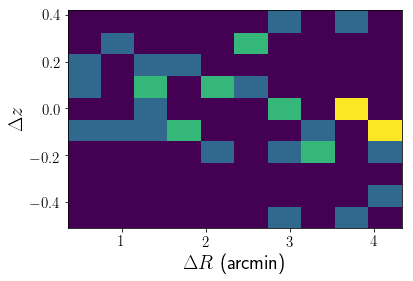

In [289]:
nside=2048 # healpix nside
maxmatch=5 # return closest match
radius=4.5/60.#? arcmin match

# ra,dec,radius in degrees
raC=np.hstack([cxcl,wxcl])#,mxcl])
decC=np.hstack([cycl,wycl])#,mycl])
zC=np.hstack([czcl,wzcl])#,mzcl])
cc=np.ones(len(zC))
cc[:len(cxcl)]=0
matches0 = smatch.match(src['ra'],src['dec'],radius,raC,decC,
                       nside=nside, maxmatch=maxmatch)
dz0=src[matches0['i1']]['z']-zC[matches0['i2']]
dr0=np.sqrt((src[matches0['i1']]['ra']-raC[matches0['i2']])**2.+(src[matches0['i1']]['dec']-decC[matches0['i2']])**2.)

src['matched'][matches0['i1']]=True
print(len(np.unique(matches0['i2'])))
print(len(np.unique(matches0['i1'])))
print(len(src))
if True:
    ind=np.lexsort((np.abs(dz0),-src['value'][matches0['i1']]))
    ind2=np.unique(matches0['i1'][ind],return_index=True)[1]
    ind3=ind[ind2]
    matches1=matches0[ind3]
    dz=dz0[ind3]
    dr=dr0[ind3]
else:
    matches1=matches0
    dz=dz0
    dr=dr0
plt.hist2d(dr*60.,dz)
plt.xlabel(r'$\Delta R$ (arcmin)',fontsize=20)
plt.ylabel(r'$\Delta z$',fontsize=20)
#plt.savefig('dzdr.png')
print(cc[matches0['i2'][ind]])
print(src['value'][matches0['i1'][ind]])

In [293]:
srcXX=src[~src['matched']]
srcYY=src[src['matched']]
srcXX

iz,iy,ix,value,ra,dec,z,matched
float64,float64,float64,float64,float64,float64,float64,bool
0.0,114.0,81.0,1.3667108060310735,33.16657169487256,-2.7352378852446737,0.09,False
5.0,17.0,104.0,2.152813212120666,33.93323836153927,-5.9685712185779956,0.39,False
7.0,54.0,106.0,3.0158314407410556,33.99990502820593,-4.735237885244667,0.51,False
8.0,125.0,100.0,3.2534425122170063,33.79990502820593,-2.3685712185780083,0.5700000000000001,False
8.0,128.0,29.0,2.5354117915712266,31.43323836153914,-2.2685712185780087,0.5700000000000001,False
9.0,21.0,92.0,3.5521545247373836,33.53323836153925,-5.835237885244663,0.63,False
9.0,84.0,55.0,3.4523515319168565,32.299905028205856,-3.73523788524467,0.63,False


In [304]:
gridInfo.xcgrid

array([30.46657169, 30.49990503, 30.53323836, 30.56657169, 30.59990503,
       30.63323836, 30.66657169, 30.69990503, 30.73323836, 30.76657169,
       30.79990503, 30.83323836, 30.86657169, 30.89990503, 30.93323836,
       30.96657169, 30.99990503, 31.03323836, 31.06657169, 31.09990503,
       31.13323836, 31.16657169, 31.19990503, 31.23323836, 31.26657169,
       31.29990503, 31.33323836, 31.36657169, 31.39990503, 31.43323836,
       31.46657169, 31.49990503, 31.53323836, 31.56657169, 31.59990503,
       31.63323836, 31.66657169, 31.69990503, 31.73323836, 31.76657169,
       31.79990503, 31.83323836, 31.86657169, 31.89990503, 31.93323836,
       31.96657169, 31.99990503, 32.03323836, 32.06657169, 32.09990503,
       32.13323836, 32.16657169, 32.19990503, 32.23323836, 32.26657169,
       32.29990503, 32.33323836, 32.36657169, 32.39990503, 32.43323836,
       32.46657169, 32.49990503, 32.53323836, 32.56657169, 32.59990503,
       32.63323836, 32.66657169, 32.69990503, 32.73323836, 32.76

In [302]:
(-2.7352378852446737+2.729457)*60.

-0.346853114680421

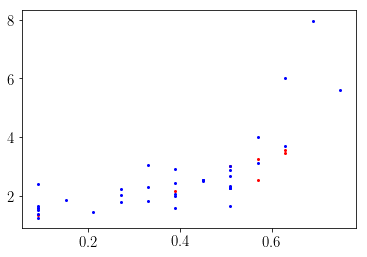

In [299]:
plt.scatter(srcXX['z'],srcXX['value'],s=4,c='red')
plt.scatter(srcYY['z'],srcYY['value'],s=4,c='blue')

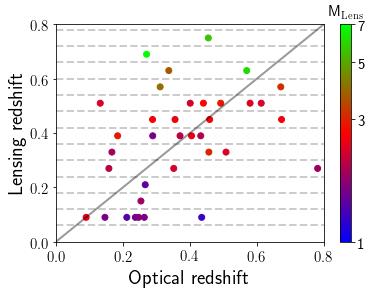

In [270]:
plt.close()
cm = plt.cm.get_cmap('brg')
norm=matplotlib.colors.SymLogNorm(vmin=1.,vmax=7,linthresh=0.01)
plt.figure(figsize=(6,5))
plt.close()
im=plt.scatter(zC[matches1['i2']],src[matches1['i1']]['z'],\
            c=src[matches1['i1']]['value'],norm=norm,cmap=cm)
plt.plot(np.linspace(0,1.2,10),np.linspace(0,1.2,10),c='black',ls='-',alpha=0.4)
for izb in gridInfo.zlbound:
    plt.plot(np.linspace(0,1.2,10),izb*np.ones(10),c='black',ls='--',alpha=0.2)
plt.xlabel('Optical redshift',fontsize=20)
plt.ylabel('Lensing redshift',fontsize=20)
plt.xlim(0.,0.8)
plt.ylim(0.,0.8)
cb=plt.colorbar()
cb.ax.set_title(r'M$_{\rm Lens}$',fontsize=15)
cb.set_ticks(())
cb.set_ticks((1,3,5,7))
cb.set_ticklabels(['1','3','5','7'])
cb.update_normal(im)
cb.config_axis()
#figname=os.path.join(figMsDir,'redshift_bias.png')
#plt.savefig(figname)

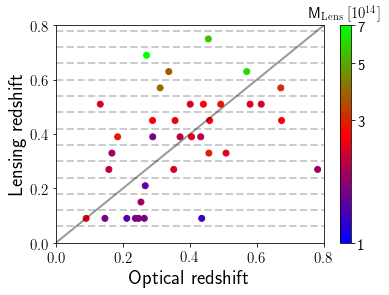

In [263]:
lt.close()
cm = plt.cm.get_cmap('brg')
norm=matplotlib.colors.SymLogNorm(vmin=1.,vmax=7,linthresh=0.01)
plt.figure(figsize=(6,5))
plt.close()
im=plt.scatter(zC[matches1['i2']],src[matches1['i1']]['z'],\
            c=src[matches1['i1']]['value'],norm=norm,cmap=cm)
plt.plot(np.linspace(0,1.2,10),np.linspace(0,1.2,10),c='black',ls='-',alpha=0.4)
for izb in gridInfo.zlbound:
    plt.plot(np.linspace(0,1.2,10),izb*np.ones(10),c='black',ls='--',alpha=0.2)
plt.xlabel('Optical redshift',fontsize=20)
plt.ylabel('Lensing redshift',fontsize=20)
plt.xlim(0.,0.8)
plt.ylim(0.,0.8)
cb=plt.colorbar()
cb.ax.set_title(r'M$_{\rm Lens}~[10^{14}]$',fontsize=15)
cb.set_ticks(())
cb.set_ticks((1,3,5,7))
cb.set_ticklabels(['1','3','5','7'])
cb.update_normal(im)
cb.config_axis()
#figname=os.path.join(figMsDir,'redshift_bias.png')
#plt.savefig(figname)

In [300]:
gridInfo.nx

152